<a href="https://colab.research.google.com/github/kwakpovwe/kwakpovwe/blob/main/Churn_Prediction_in_the_Telecom_Sector_Comparative_Analysis_of_Random_Forest_and_K_Nearest_Neighbors_for_Predictive_Modelling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

https://archive.ics.uci.edu/dataset/563/iranian+churn+dataset

This dataset is randomly collected from an Iranian telecom companyâ€™s database over a period of 12 months. A total of 3150 rows of data, each representing a customer, bear information for 13 columns. The attributes that are in this dataset
are call failures, frequency of SMS, number of complaints, number of distinct calls, subscription length, age group, the charge amount, type of service, seconds of use, status, frequency of use, and Customer Value.

All of the attributes except for attribute churn is the aggregated data of the first 9 months. The churn labels are the state of the customers at the end of 12 months. The three months is the designated planning gap.

In [ ]:
#1) Install all Libraries (Pandas, nympy, Scikit-learn, Matplotlib, seaborn)

!pip install pandas

In [ ]:
# 2. Load the file into a Data Frame
import numpy as np
import pandas as pd
import sklearn as sk
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
import pandas as pd
Customer_ChurnDF = pd.read_csv('Customer_Churn.csv')

In [ ]:
# 3. Viewing the Content of the data frame by calling its name

Customer_ChurnDF

,Call Failure,Complains,Subscription Length,Sex,Charge Amount,Seconds of Use,Frequency of use,Frequency of SMS,Distinct Called Numbers,Age Group,Tariff Plan,Status,Age,Customer Value,Churn
0,8.0,0.0,38.0,M,0.0,4370,71.0,5.0,17.0,3,1.0,1,30.0,197.640,0
1,0.0,0.0,39.0,M,0.0,318,5.0,7.0,4.0,2,1.0,2,25.0,46.035,0
2,10.0,0.0,37.0,F,0.0,2453,60.0,359.0,24.0,3,1.0,1,30.0,1536.520,0
3,10.0,0.0,38.0,M,0.0,4198,66.0,1.0,35.0,1,1.0,1,NaN,240.020,0
4,3.0,0.0,38.0,M,0.0,2393,58.0,2.0,33.0,1,1.0,1,15.0,145.805,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3145,21.0,0.0,19.0,F,2.0,6697,147.0,92.0,44.0,2,2.0,1,25.0,721.980,0
3146,17.0,0.0,17.0,F,1.0,9237,177.0,80.0,42.0,5,1.0,1,55.0,261.210,0
3147,13.0,0.0,18.0,F,4.0,3157,51.0,38.0,21.0,3,1.0,1,30.0,280.320,0
3148,7.0,0.0,11.0,F,2.0,4695,46.0,222.0,12.0,3,1.0,1,30.0,1077.640,0


In [ ]:
Customer_ChurnDF['Churn'].value_counts()


# 5. Showing the first, second, and third column

#Customer_ChurnDF.iloc[:,0:3]

Churn
0    2655
1     495
Name: count, dtype: int64

In [ ]:
# 4. Showing all elements using iloc

Customer_ChurnDF.iloc[:,:]

,Call Failure,Complains,Subscription Length,Sex,Charge Amount,Seconds of Use,Frequency of use,Frequency of SMS,Distinct Called Numbers,Age Group,Tariff Plan,Status,Age,Customer Value,Churn
0,8.0,0.0,38.0,M,0.0,4370,71.0,5.0,17.0,3,1.0,1,30.0,197.640,0
1,0.0,0.0,39.0,M,0.0,318,5.0,7.0,4.0,2,1.0,2,25.0,46.035,0
2,10.0,0.0,37.0,F,0.0,2453,60.0,359.0,24.0,3,1.0,1,30.0,1536.520,0
3,10.0,0.0,38.0,M,0.0,4198,66.0,1.0,35.0,1,1.0,1,NaN,240.020,0
4,3.0,0.0,38.0,M,0.0,2393,58.0,2.0,33.0,1,1.0,1,15.0,145.805,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3145,21.0,0.0,19.0,F,2.0,6697,147.0,92.0,44.0,2,2.0,1,25.0,721.980,0
3146,17.0,0.0,17.0,F,1.0,9237,177.0,80.0,42.0,5,1.0,1,55.0,261.210,0
3147,13.0,0.0,18.0,F,4.0,3157,51.0,38.0,21.0,3,1.0,1,30.0,280.320,0
3148,7.0,0.0,11.0,F,2.0,4695,46.0,222.0,12.0,3,1.0,1,30.0,1077.640,0


In [ ]:
# 5. Showing the first, second, and third column

Customer_ChurnDF.iloc[:,0:3]

,Call Failure,Complains,Subscription Length
0,8.0,0.0,38.0
1,0.0,0.0,39.0
2,10.0,0.0,37.0
3,10.0,0.0,38.0
4,3.0,0.0,38.0
...,...,...,...
3145,21.0,0.0,19.0
3146,17.0,0.0,17.0
3147,13.0,0.0,18.0
3148,7.0,0.0,11.0


In [ ]:
# 6. Returning the Customer Value of the Dataset

Customer_ChurnDF['Customer Value']

0        197.640
1         46.035
2       1536.520
3        240.020
4        145.805
          ...   
3145     721.980
3146     261.210
3147     280.320
3148    1077.640
3149     100.680
Name: Customer Value, Length: 3150, dtype: float64

In [ ]:
# Drop the "Status" and "Education" variables

#Customer_ChurnDF = Customer_ChurnDF.drop(['Status', 'Education'], axis=1)



In [ ]:
 #Run the dataset.describe()

Customer_ChurnDF.describe()


,Call Failure,Complains,Subscription Length,Charge Amount,Seconds of Use,Frequency of use,Frequency of SMS,Distinct Called Numbers,Age Group,Tariff Plan,Status,Age,Customer Value,Churn
count,3149.000000,3149.000000,3147.000000,3149.000000,3150.000000,3142.000000,3142.000000,3144.000000,3150.000000,3148.000000,3150.000000,3148.000000,3148.000000,3150.000000
mean,7.626548,0.076215,32.538290,0.942204,4472.459683,69.493635,73.141311,23.509224,2.826032,1.077827,1.248254,31.005400,471.169941,0.157143
std,7.264621,0.265383,8.576164,1.520871,4197.908687,57.382554,112.305082,17.220471,0.892555,0.267942,0.432069,8.828646,517.120402,0.363993
min,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,15.000000,0.000000,0.000000
25%,1.000000,0.000000,29.500000,0.000000,1391.250000,27.000000,6.000000,10.000000,2.000000,1.000000,1.000000,25.000000,113.780000,0.000000
50%,6.000000,0.000000,35.000000,0.000000,2990.000000,54.000000,21.000000,21.000000,3.000000,1.000000,1.000000,30.000000,228.520000,0.000000
75%,12.000000,0.000000,38.000000,1.000000,6478.250000,95.000000,87.000000,34.000000,3.000000,1.000000,1.000000,30.000000,788.827500,0.000000
max,36.000000,1.000000,47.000000,10.000000,17090.000000,255.000000,522.000000,97.000000,5.000000,2.000000,2.000000,55.000000,2165.280000,1.000000


In [ ]:
#Run the dataset.describe()

description = Customer_ChurnDF.describe()

# apply color gradient to the columns
description_styled = description.style.background_gradient()

# display the styled output
description_styled

,Call Failure,Complains,Subscription Length,Charge Amount,Seconds of Use,Frequency of use,Frequency of SMS,Distinct Called Numbers,Age Group,Tariff Plan,Status,Age,Customer Value,Churn
count,3149.000000,3149.000000,3147.000000,3149.000000,3150.000000,3142.000000,3142.000000,3144.000000,3150.000000,3148.000000,3150.000000,3148.000000,3148.000000,3150.000000
mean,7.626548,0.076215,32.538290,0.942204,4472.459683,69.493635,73.141311,23.509224,2.826032,1.077827,1.248254,31.005400,471.169941,0.157143
std,7.264621,0.265383,8.576164,1.520871,4197.908687,57.382554,112.305082,17.220471,0.892555,0.267942,0.432069,8.828646,517.120402,0.363993
min,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,15.000000,0.000000,0.000000
25%,1.000000,0.000000,29.500000,0.000000,1391.250000,27.000000,6.000000,10.000000,2.000000,1.000000,1.000000,25.000000,113.780000,0.000000
50%,6.000000,0.000000,35.000000,0.000000,2990.000000,54.000000,21.000000,21.000000,3.000000,1.000000,1.000000,30.000000,228.520000,0.000000
75%,12.000000,0.000000,38.000000,1.000000,6478.250000,95.000000,87.000000,34.000000,3.000000,1.000000,1.000000,30.000000,788.827500,0.000000
max,36.000000,1.000000,47.000000,10.000000,17090.000000,255.000000,522.000000,97.000000,5.000000,2.000000,2.000000,55.000000,2165.280000,1.000000


In [ ]:
# Define the colors for the gradient
color_map = 'RdYlGn'

# Apply the gradient to the Churn column
churn_colored = Customer_ChurnDF.style.background_gradient(subset=['Churn'], cmap=color_map)

# Display the styled output
churn_colored

,Call Failure,Complains,Subscription Length,Sex,Charge Amount,Seconds of Use,Frequency of use,Frequency of SMS,Distinct Called Numbers,Age Group,Tariff Plan,Status,Age,Customer Value,Churn
0,8.000000,0.000000,38.000000,M,0.000000,4370,71.000000,5.000000,17.000000,3,1.000000,1,30.000000,197.640000,0
1,0.000000,0.000000,39.000000,M,0.000000,318,5.000000,7.000000,4.000000,2,1.000000,2,25.000000,46.035000,0
2,10.000000,0.000000,37.000000,F,0.000000,2453,60.000000,359.000000,24.000000,3,1.000000,1,30.000000,1536.520000,0
3,10.000000,0.000000,38.000000,M,0.000000,4198,66.000000,1.000000,35.000000,1,1.000000,1,nan,240.020000,0
4,3.000000,0.000000,38.000000,M,0.000000,2393,58.000000,2.000000,33.000000,1,1.000000,1,15.000000,145.805000,0
5,11.000000,0.000000,38.000000,M,1.000000,3775,82.000000,32.000000,28.000000,3,1.000000,1,30.000000,282.280000,0
6,4.000000,0.000000,38.000000,M,0.000000,2360,39.000000,285.000000,18.000000,3,1.000000,1,30.000000,1235.960000,0
7,13.000000,0.000000,37.000000,F,2.000000,9115,121.000000,144.000000,43.000000,3,1.000000,1,30.000000,945.440000,0
8,7.000000,0.000000,38.000000,F,0.000000,13773,169.000000,0.000000,44.000000,3,1.000000,1,30.000000,557.680000,0
9,7.000000,0.000000,38.000000,F,1.000000,4515,83.000000,2.000000,nan,3,1.000000,1,30.000000,191.920000,0


In [ ]:
#12. Checking for Missing values using .isnull()

Customer_ChurnDF.isnull().sum()

Call Failure                 1
Complains                    1
Subscription Length          3
Sex                        102
Charge Amount                1
Seconds of Use               0
Frequency of use             8
Frequency of SMS             8
Distinct Called Numbers      6
Age Group                    0
Tariff Plan                  2
Status                       0
Age                          2
Customer Value               2
Churn                        0
dtype: int64

In [ ]:
import pandas as pd

# Assuming your DataFrame is named 'Customer_ChurnDF'
# Select numeric columns for mean calculation
numeric_columns = Customer_ChurnDF.select_dtypes(include=['float64', 'int64']).columns

# Fill missing values in numeric columns with the mean
Customer_ChurnDF[numeric_columns] = Customer_ChurnDF[numeric_columns].fillna(Customer_ChurnDF[numeric_columns].mean())


In [ ]:
# 15. For categorical variables use most frequent and constant technique to fill Missing Values
from sklearn.impute import SimpleImputer

In [ ]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OrdinalEncoder

# Assuming Customer_ChurnDF is your DataFrame

# Encode categorical variables
ordinal_encoder = OrdinalEncoder()
Customer_ChurnDF['Sex'] = ordinal_encoder.fit_transform(Customer_ChurnDF[['Sex']])

# Handle missing values in the 'Sex' column
imputer = SimpleImputer(strategy='most_frequent')
Customer_ChurnDF['Sex'] = imputer.fit_transform(Customer_ChurnDF[['Sex']])

In [ ]:
# 16. Checking for Missing values using .isnull()
#From the display below, there is no more missing value for the Dataset

Customer_ChurnDF.isnull().sum()

Call Failure               0
Complains                  0
Subscription Length        0
Sex                        0
Charge Amount              0
Seconds of Use             0
Frequency of use           0
Frequency of SMS           0
Distinct Called Numbers    0
Age Group                  0
Tariff Plan                0
Status                     0
Age                        0
Customer Value             0
Churn                      0
dtype: int64

In [ ]:
#17. Install Scikit
!pip install scikit-learn

In [ ]:
#18. Convert all Categorical features to integer codes using either OrdinalEncoder or OnehotEncoder using preprocessing
from sklearn.preprocessing import OrdinalEncoder

In [ ]:
enc = OrdinalEncoder()
Customer_ChurnDF['Sex'] = enc.fit_transform(Customer_ChurnDF[['Sex']])

Customer_ChurnDF

,Call Failure,Complains,Subscription Length,Sex,Charge Amount,Seconds of Use,Frequency of use,Frequency of SMS,Distinct Called Numbers,Age Group,Tariff Plan,Status,Age,Customer Value,Churn
0,8.0,0.0,38.0,1.0,0.0,4370,71.0,5.0,17.0,3,1.0,1,30.0000,197.640,0
1,0.0,0.0,39.0,1.0,0.0,318,5.0,7.0,4.0,2,1.0,2,25.0000,46.035,0
2,10.0,0.0,37.0,0.0,0.0,2453,60.0,359.0,24.0,3,1.0,1,30.0000,1536.520,0
3,10.0,0.0,38.0,1.0,0.0,4198,66.0,1.0,35.0,1,1.0,1,31.0054,240.020,0
4,3.0,0.0,38.0,1.0,0.0,2393,58.0,2.0,33.0,1,1.0,1,15.0000,145.805,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3145,21.0,0.0,19.0,0.0,2.0,6697,147.0,92.0,44.0,2,2.0,1,25.0000,721.980,0
3146,17.0,0.0,17.0,0.0,1.0,9237,177.0,80.0,42.0,5,1.0,1,55.0000,261.210,0
3147,13.0,0.0,18.0,0.0,4.0,3157,51.0,38.0,21.0,3,1.0,1,30.0000,280.320,0
3148,7.0,0.0,11.0,0.0,2.0,4695,46.0,222.0,12.0,3,1.0,1,30.0000,1077.640,0


In [ ]:
# 19. Standardization of the data using preprocessing and Standardization utility class or MinMaxscaler
from sklearn.preprocessing import StandardScaler

In [ ]:
scaler = StandardScaler()
Customer_ChurnDF_scaled = scaler.fit_transform(Customer_ChurnDF)


C:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


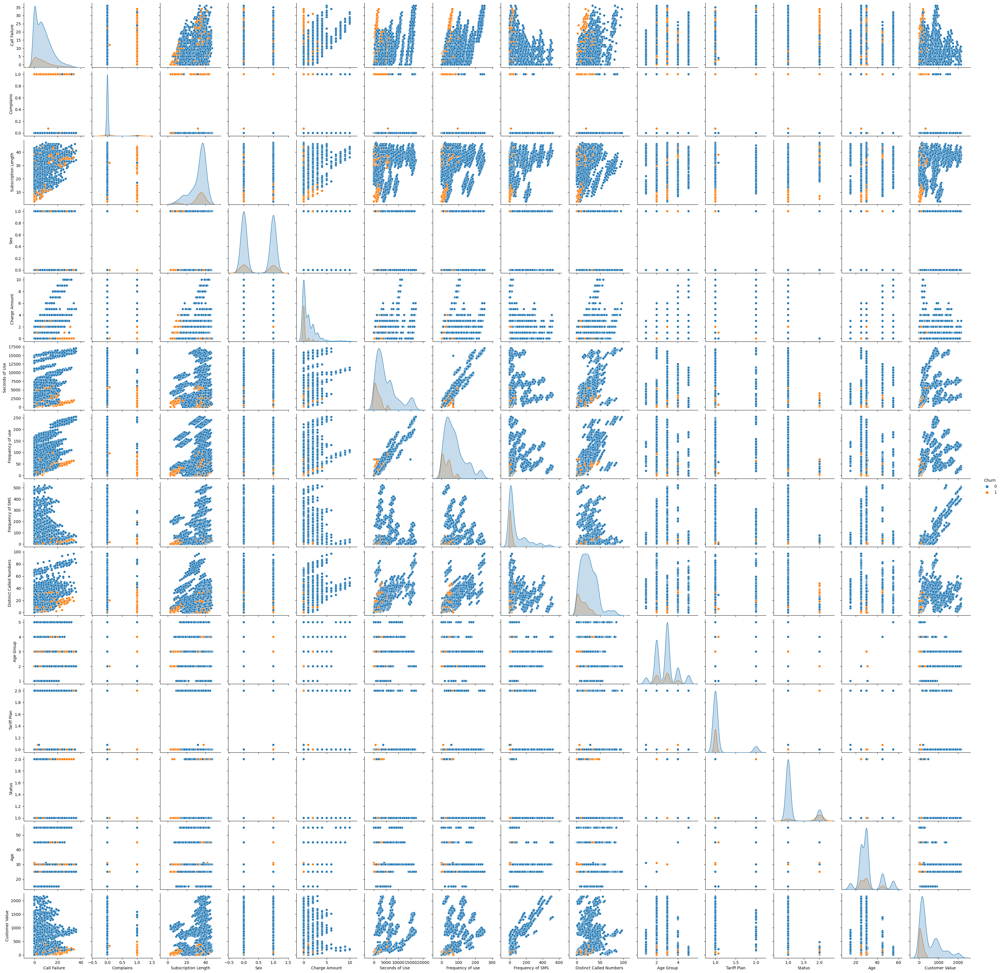

In [ ]:
#Visualize the relationship between different variables and churn using Seaborn to provide plot types useful for statistical data exploration

import seaborn as sns
sns.pairplot(Customer_ChurnDF, hue='Churn')

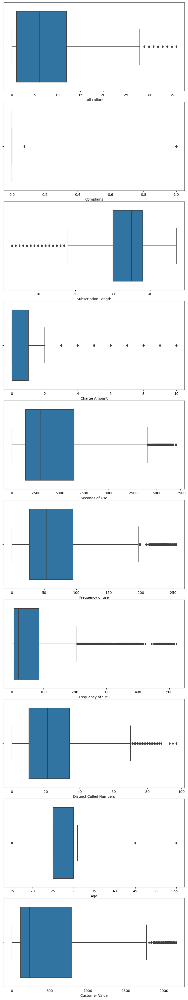

In [ ]:
#Identifying Outliers from the Dataset

import matplotlib.pyplot as plt
import seaborn as sns

# Select the numerical columns
numeric_columns = ['Call Failure', 'Complains', 'Subscription Length', 'Charge Amount',
                   'Seconds of Use', 'Frequency of use', 'Frequency of SMS',
                   'Distinct Called Numbers', 'Age', 'Customer Value']

# Create subplots for each column
fig, axes = plt.subplots(nrows=len(numeric_columns), ncols=1, figsize=(8, 4 * len(numeric_columns)))
fig.tight_layout()

# Plot box plots for each column
for i, column in enumerate(numeric_columns):
    sns.boxplot(x=Customer_ChurnDF[column], ax=axes[i])
    axes[i].set_xlabel(column)

plt.show()



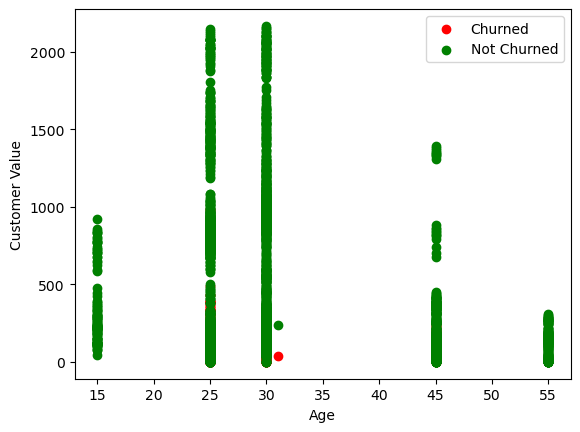

In [ ]:
#Generate queries from the Dataset using the class target label and plot their visualization

import matplotlib.pyplot as plt
churned = Customer_ChurnDF[Customer_ChurnDF['Churn'] == 1]
not_churned = Customer_ChurnDF[Customer_ChurnDF['Churn'] == 0]
plt.scatter(churned['Age'], churned['Customer Value'], color='red', label='Churned')
plt.scatter(not_churned['Age'], not_churned['Customer Value'], color='green', label='Not Churned')
plt.xlabel('Age')
plt.ylabel('Customer Value')
plt.legend()
plt.show()

In [ ]:
#Train the model

from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split

In [ ]:
#splitting the X and y data into training and testing sets using the train_test_split() function from the sklearn.model_selection module.
#We use stratify to **********

X = Customer_ChurnDF.drop('Churn', axis=1)
y = Customer_ChurnDF['Churn']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify = y, random_state=42)

In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split

# Splitting the data into training and testing sets with stratification
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Instantiate SMOTE
smote = SMOTE(random_state=42)

# Apply SMOTE to the training data
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline

# Create an imputer transformer to fill in missing values
imputer = SimpleImputer()

# Create a pipeline that includes the imputer and the random forest classifier
pipeline = make_pipeline(imputer, RandomForestClassifier(n_estimators=100, random_state=42))

# Fit the pipeline on the training data
pipeline.fit(X_train, y_train)

# Predict with the trained model
y_pred_rf = pipeline.predict(X_test)

In [ ]:
# Logistic Regression
lr = LogisticRegression(random_state=42)
lr.fit(X_train, y_train)
y_pred_lr = lr.predict(X_test)
y_pred_lr

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [ ]:
# K-NN
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)
y_pred_knn = knn.predict(X_test)
y_pred_knn

array([1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,

 1) Use the confusion_matrix function to generate a confusion matrix using our generated predictions (y_pred) and the true class labels for the test data (y_test) and use a seaborn heatmap to visualize these results.

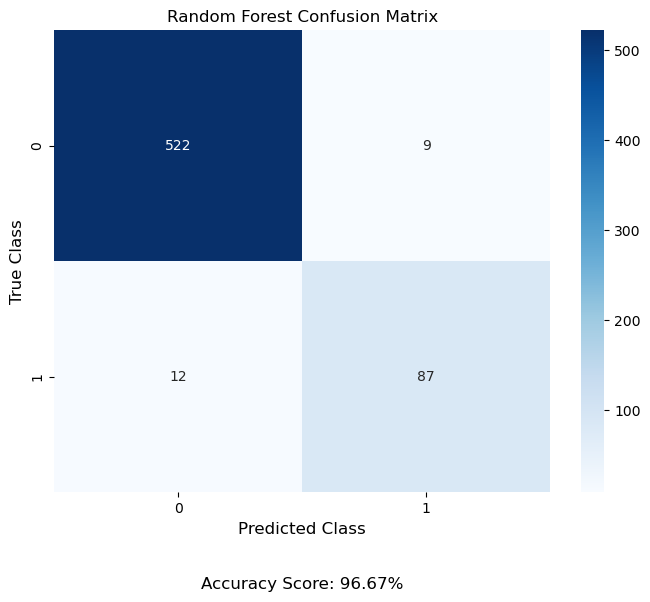

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score

# Import confusion_matrix and accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns

# Random Forest
cm_rf = confusion_matrix(y_test, y_pred_rf)
accuracy = accuracy_score(y_test, y_pred_rf)  # Calculate the accuracy score

plt.figure(figsize=(8, 6))
ax = sns.heatmap(cm_rf, annot=True, cmap='Blues', fmt='d')
plt.xlabel('Predicted Class', fontsize=12)
plt.ylabel('True Class', fontsize=12)
plt.title('Random Forest Confusion Matrix', fontsize=12)

# Display the accuracy score as a text annotation
plt.text(0.5, -0.2, f'Accuracy Score: {accuracy * 100:.2f}%', fontsize=12, ha='center', va='center', transform=ax.transAxes)

plt.show()


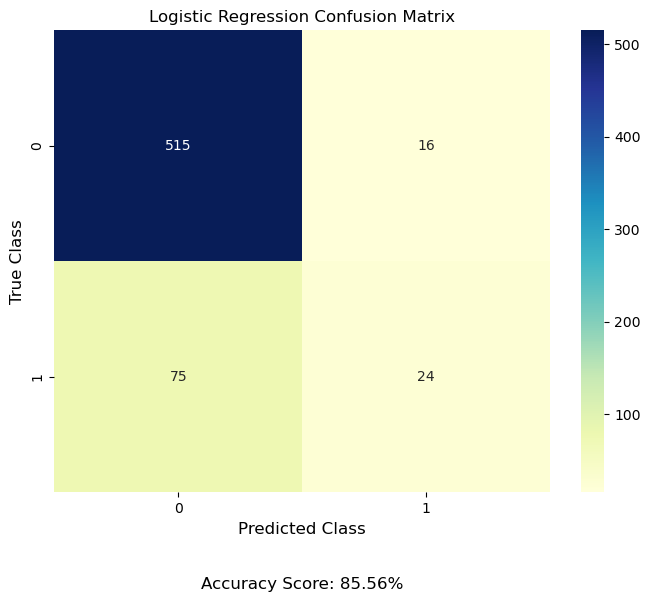

In [ ]:
# Logistic Regression
cm_lr = confusion_matrix(y_test, y_pred_lr)
accuracy = accuracy_score(y_test, y_pred_lr)  # Calculate the accuracy score

plt.figure(figsize=(8, 6))
ax = sns.heatmap(cm_lr, annot=True, cmap='YlGnBu', fmt='d')
plt.xlabel('Predicted Class', fontsize=12)
plt.ylabel('True Class', fontsize=12)
plt.title('Logistic Regression Confusion Matrix', fontsize=12)

# Display the accuracy score as a text annotation
plt.text(0.5, -0.2, f'Accuracy Score: {accuracy * 100:.2f}%', fontsize=12, ha='center', va='center', transform=ax.transAxes)

plt.show()


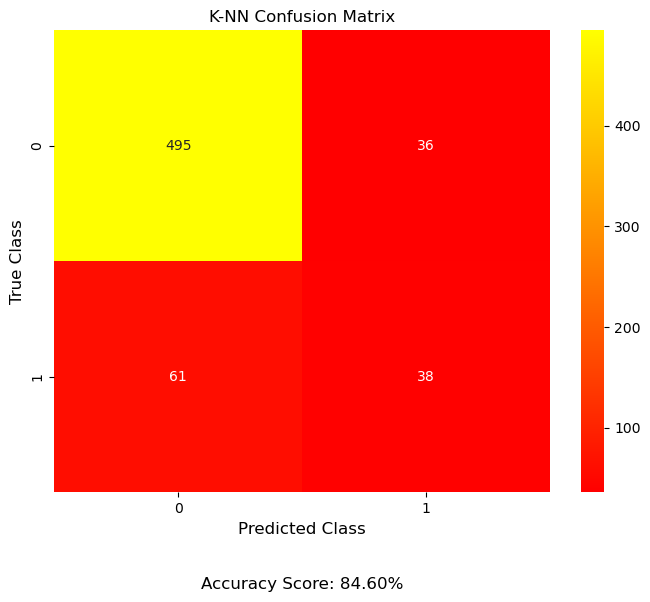

In [ ]:
# K-NN
cm_knn = confusion_matrix(y_test, y_pred_knn)
accuracy = accuracy_score(y_test, y_pred_knn)  # Calculate the accuracy score

plt.figure(figsize=(8, 6))
ax = sns.heatmap(cm_knn, annot=True, cmap='autumn', fmt='d')

# Change cmap to 'autumn' for an attractive color
plt.xlabel('Predicted Class', fontsize=12)
plt.ylabel('True Class', fontsize=12)
plt.title('K-NN Confusion Matrix', fontsize=12)

# Display the accuracy score as a text annotation
plt.text(0.5, -0.2, f'Accuracy Score: {accuracy * 100:.2f}%', fontsize=12, ha='center', va='center', transform=ax.transAxes)

plt.show()


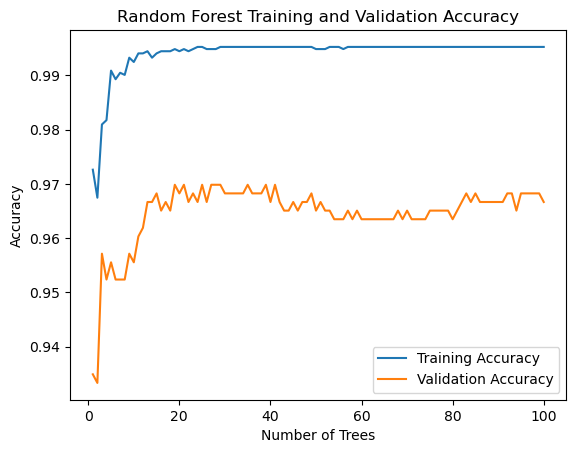

In [ ]:
#Once the training has completed, plot the training and validation accuracy

from sklearn.metrics import accuracy_score
import numpy as np

# Random Forest
train_acc_rf = []
val_acc_rf = []
for i in range(1, 101):
    rf = RandomForestClassifier(n_estimators=i, random_state=42)
    rf.fit(X_train, y_train)
    y_pred_train_rf = rf.predict(X_train)
    y_pred_val_rf = rf.predict(X_test)
    train_acc_rf.append(accuracy_score(y_train, y_pred_train_rf))
    val_acc_rf.append(accuracy_score(y_test, y_pred_val_rf))

plt.plot(np.arange(1, 101), train_acc_rf, label='Training Accuracy')
plt.plot(np.arange(1, 101), val_acc_rf, label='Validation Accuracy')
plt.xlabel('Number of Trees')
plt.ylabel('Accuracy')
plt.title('Random Forest Training and Validation Accuracy')
plt.legend()
plt.show()

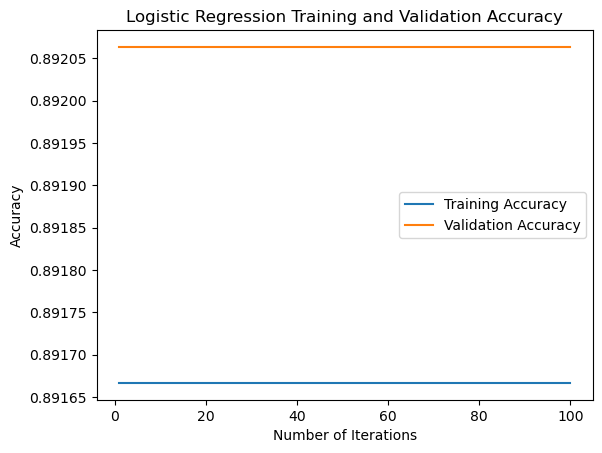

In [ ]:
from sklearn.preprocessing import StandardScaler

# Scale the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Logistic Regression
train_acc_lr = []
val_acc_lr = []
for i in range(1, 101):
    lr = LogisticRegression(random_state=42, max_iter=1000)  # Increase the max_iter parameter
    lr.fit(X_train_scaled, y_train)
    y_pred_train_lr = lr.predict(X_train_scaled)
    y_pred_val_lr = lr.predict(X_test_scaled)
    train_acc_lr.append(accuracy_score(y_train, y_pred_train_lr))
    val_acc_lr.append(accuracy_score(y_test, y_pred_val_lr))

plt.plot(np.arange(1, 101), train_acc_lr, label='Training Accuracy')
plt.plot(np.arange(1, 101), val_acc_lr, label='Validation Accuracy')
plt.xlabel('Number of Iterations')
plt.ylabel('Accuracy')
plt.title('Logistic Regression Training and Validation Accuracy')
plt.legend()
plt.show()

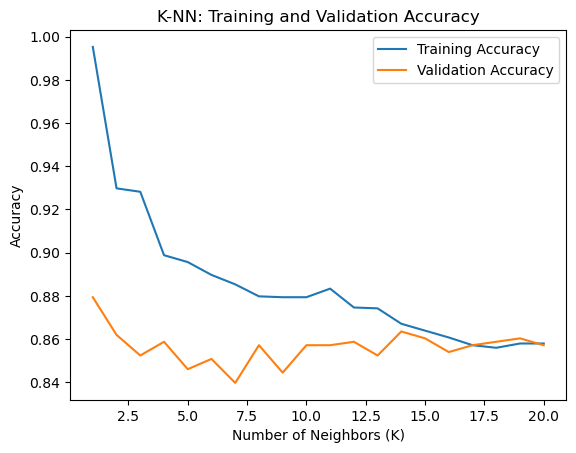

In [ ]:
# K-NN
train_acc_knn = []
val_acc_knn = []
for i in range(1, 21):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, y_train)
    y_pred_train_knn = knn.predict(X_train)
    y_pred_val_knn = knn.predict(X_test)
    train_acc_knn.append(accuracy_score(y_train, y_pred_train_knn))
    val_acc_knn.append(accuracy_score(y_test, y_pred_val_knn))

plt.plot(np.arange(1, 21), train_acc_knn, label='Training Accuracy')
plt.plot(np.arange(1, 21), val_acc_knn, label='Validation Accuracy')
plt.xlabel('Number of Neighbors (K)')
plt.ylabel('Accuracy')
plt.title('K-NN: Training and Validation Accuracy')
plt.legend()
plt.show()

In [ ]:
# 16. Model evaluation for the three Models- Random forest, Regression and K-NN) and include the classification report for Precision, Recall, F1-score

from sklearn.metrics import classification_report

# Random Forest
y_pred_rf = rf.predict(X_test)
print('Random Forest Classification Report:')
print(classification_report(y_test, y_pred_rf))

Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98       531
           1       0.91      0.88      0.89        99

    accuracy                           0.97       630
   macro avg       0.94      0.93      0.94       630
weighted avg       0.97      0.97      0.97       630



In [ ]:
print('K-NN Classification Report:')
print(classification_report(y_test, y_pred_knn))

K-NN Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.93      0.91       531
           1       0.51      0.38      0.44        99

    accuracy                           0.85       630
   macro avg       0.70      0.66      0.68       630
weighted avg       0.83      0.85      0.84       630



In [ ]:
print('Logistic Regression Classification Report:')
print(classification_report(y_test, y_pred_lr))

Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.97      0.92       531
           1       0.60      0.24      0.35        99

    accuracy                           0.86       630
   macro avg       0.74      0.61      0.63       630
weighted avg       0.83      0.86      0.83       630



# # Churn Prevention Implementation Strategies

In [ ]:
# 18. Sort the customers by their churn probability
Customer_ChurnDF['Churn Probability'] = rf.predict_proba(X)[:, 1]
Customer_ChurnDF_sorted = Customer_ChurnDF.sort_values(by='Churn Probability', ascending=False)
Customer_ChurnDF_sorted

,Call Failure,Complains,Subscription Length,Sex,Charge Amount,Seconds of Use,Frequency of use,Frequency of SMS,Distinct Called Numbers,Age Group,Tariff Plan,Status,Age,Customer Value,Churn,Churn Probability
3149,8.0,1.0,11.0,1.0,2.0,1792,25.0,7.0,9.0,3,1.0,1,30.0,100.680,1,1.0
1727,6.0,1.0,34.0,0.0,0.0,2153,39.0,36.0,32.0,3,1.0,2,30.0,231.680,1,1.0
1676,4.0,1.0,32.0,0.0,0.0,2570,29.0,0.0,10.0,2,1.0,2,25.0,116.955,1,1.0
1427,6.0,1.0,37.0,1.0,0.0,2143,46.0,38.0,34.0,3,1.0,2,30.0,239.560,1,1.0
1778,0.0,0.0,34.0,0.0,0.0,0,0.0,0.0,0.0,3,1.0,2,30.0,0.000,1,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
835,4.0,0.0,41.0,1.0,1.0,3718,88.0,10.0,29.0,3,1.0,1,30.0,192.240,0,0.0
837,8.0,0.0,41.0,1.0,1.0,2780,59.0,183.0,24.0,2,1.0,1,25.0,951.255,0,0.0
1947,9.0,0.0,15.0,0.0,3.0,3257,50.0,32.0,17.0,3,1.0,1,30.0,260.280,0,0.0
1946,13.0,0.0,14.0,1.0,0.0,9337,176.0,74.0,38.0,4,1.0,1,45.0,422.825,0,0.0


In [ ]:
 #19. Identify the top 10% of customers with the highest churn probability

top_10_percent = int(len(Customer_ChurnDF_sorted) * 0.1)
top_10 = Customer_ChurnDF_sorted.head(top_10_percent)
top_10

,Call Failure,Complains,Subscription Length,Sex,Charge Amount,Seconds of Use,Frequency of use,Frequency of SMS,Distinct Called Numbers,Age Group,Tariff Plan,Status,Age,Customer Value,Churn,Churn Probability
3149,8.0,1.0,11.0,1.0,2.0,1792,25.0,7.0,9.0,3,1.0,1,30.0,100.680,1,1.00
1727,6.0,1.0,34.0,0.0,0.0,2153,39.0,36.0,32.0,3,1.0,2,30.0,231.680,1,1.00
1676,4.0,1.0,32.0,0.0,0.0,2570,29.0,0.0,10.0,2,1.0,2,25.0,116.955,1,1.00
1427,6.0,1.0,37.0,1.0,0.0,2143,46.0,38.0,34.0,3,1.0,2,30.0,239.560,1,1.00
1778,0.0,0.0,34.0,0.0,0.0,0,0.0,0.0,0.0,3,1.0,2,30.0,0.000,1,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1028,0.0,0.0,36.0,1.0,0.0,133,2.0,0.0,2.0,3,1.0,2,30.0,5.400,1,0.89
2828,3.0,0.0,38.0,0.0,0.0,248,7.0,0.0,1.0,3,1.0,2,30.0,10.200,1,0.89
2328,5.0,0.0,34.0,1.0,0.0,305,6.0,7.0,2.0,3,1.0,2,30.0,40.440,1,0.89
131,0.0,0.0,34.0,0.0,0.0,568,4.0,4.0,2.0,4,1.0,2,45.0,24.300,1,0.89


In [ ]:
# Group the customers by age group
age_groups = Customer_ChurnDF.groupby('Age Group')

# Iterate over the age groups
for age, group in age_groups:
    # Find the customer with the highest customer value
    highest_value = group.loc[group['Customer Value'].idxmax()]

    # Find the customer with the lowest customer value
    lowest_value = group.loc[group['Customer Value'].idxmin()]

    # Print the results
    print(f"Age Group: {age}")
    print(f"Highest Customer Value: {highest_value['Customer Value']}")
    print(f"Lowest Customer Value: {lowest_value['Customer Value']}")
    print()

Age Group: 1
Highest Customer Value: 920.315
Lowest Customer Value: 45.375

Age Group: 2
Highest Customer Value: 2148.03
Lowest Customer Value: 0.0

Age Group: 3
Highest Customer Value: 2165.28
Lowest Customer Value: 0.0

Age Group: 4
Highest Customer Value: 1393.85
Lowest Customer Value: 0.0

Age Group: 5
Highest Customer Value: 311.04
Lowest Customer Value: 0.0



In [ ]:
# Group the customers by age group
age_groups = Customer_ChurnDF.groupby('Age Group')

# Iterate over the age groups
for age, group in age_groups:
    # Find the customer with the highest customer value
    highest_value = group.loc[group['Customer Value'].idxmax()]

    # Find the customer with the lowest customer value
    lowest_value = group.loc[group['Customer Value'].idxmin()]

    # Print the results for each age group
    print(f"Age Group: {age}")
    print(f"Highest Customer Value: {highest_value['Customer Value']}")
    print(f"Lowest Customer Value: {lowest_value['Customer Value']}")
    print()

    # Implement personalized churn prevention strategies for the age group with high customer value
    if highest_value['Customer Value'] > 940:
        print(f'Sending targeted offer to age group {age} with high customer value')
        # Add more personalized churn prevention strategies for the age group with high customer value
        # ...

# Send the offers to the age groups with high customer value
print('Offers sent to age groups with high customer value')

# Indicate the age group with the final print out
print(f"Churn prevention strategies implemented for all age groups")

Age Group: 1
Highest Customer Value: 920.315
Lowest Customer Value: 45.375

Age Group: 2
Highest Customer Value: 2148.03
Lowest Customer Value: 0.0

Sending targeted offer to age group 2 with high customer value
Age Group: 3
Highest Customer Value: 2165.28
Lowest Customer Value: 0.0

Sending targeted offer to age group 3 with high customer value
Age Group: 4
Highest Customer Value: 1393.85
Lowest Customer Value: 0.0

Sending targeted offer to age group 4 with high customer value
Age Group: 5
Highest Customer Value: 311.04
Lowest Customer Value: 0.0

Offers sent to age groups with high customer value
Churn prevention strategies implemented for all age groups


In [ ]:
# Calculate the churn probability for each customer
Customer_ChurnDF['Churn Probability'] = Customer_ChurnDF['Churn Probability']

In [ ]:
# Sort the customers by churn probability and select the top 10%
top_10_customers = Customer_ChurnDF.sort_values('Churn Probability', ascending=False).head(int(len(Customer_ChurnDF) * 0.1))

In [ ]:
# Create a sample DataFrame
data = {
    'Churn Probability': np.random.rand(100),
    'Customer Value': np.random.randint(100, 1000, 100)
}
Customer_ChurnDF = pd.DataFrame(data)

# Add a 'Customer ID' column with unique values
Customer_ChurnDF.insert(0, 'Customer ID', range(1, 101))

# Sort the DataFrame by Customer Value in descending order
top_10_customers = Customer_ChurnDF.sort_values('Customer Value', ascending=False).head(10)

# Iterate over the top 10 customers
for index, row in top_10_customers.iterrows():
    # Access the relevant customer information
    customer_id = row['Customer ID']
    churn_probability = row['Churn Probability']
    customer_value = row['Customer Value']
    print(customer_id, churn_probability, customer_value)


66.0 0.7025671680550785 981.0
87.0 0.8362269905174843 975.0
21.0 0.7670491289774324 967.0
34.0 0.43542648561258035 950.0
56.0 0.9048524705068084 950.0
18.0 0.5327183418253367 924.0
30.0 0.4154890756955564 922.0
32.0 0.4357431029271812 912.0
54.0 0.04691309985925396 903.0
40.0 0.5285311242166928 897.0


In [ ]:
# Implement personalized churn prevention strategies

if churn_probability > 0.5:
    print(f'Sending targeted offer to customer {customer_id} with high churn probability')
if customer_value > 940:
    print(f'Providing personalized recommendation to customer {customer_id} with high value')

Sending targeted offer to customer 40.0 with high churn probability
